<h1>2nd task - Grayscale conversion<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import-dependencies" data-toc-modified-id="Import-dependencies-1">Import dependencies</a></span></li><li><span><a href="#Load-data" data-toc-modified-id="Load-data-2">Load data</a></span></li><li><span><a href="#Gray-scale-conversion" data-toc-modified-id="Gray-scale-conversion-3">Gray scale conversion</a></span><ul class="toc-item"><li><span><a href="#Simple-averaging" data-toc-modified-id="Simple-averaging-3.1">Simple averaging</a></span></li><li><span><a href="#Weighted-average" data-toc-modified-id="Weighted-average-3.2">Weighted average</a></span><ul class="toc-item"><li><span><a href="#First-weighted-formula" data-toc-modified-id="First-weighted-formula-3.2.1">First weighted formula</a></span></li><li><span><a href="#Second-weighted-formula" data-toc-modified-id="Second-weighted-formula-3.2.2">Second weighted formula</a></span></li><li><span><a href="#Third-weighted-formula" data-toc-modified-id="Third-weighted-formula-3.2.3">Third weighted formula</a></span></li></ul></li><li><span><a href="#Desaturation" data-toc-modified-id="Desaturation-3.3">Desaturation</a></span></li><li><span><a href="#Decomposition" data-toc-modified-id="Decomposition-3.4">Decomposition</a></span><ul class="toc-item"><li><span><a href="#Maximum-RGB" data-toc-modified-id="Maximum-RGB-3.4.1">Maximum RGB</a></span></li><li><span><a href="#Minimum-RGB" data-toc-modified-id="Minimum-RGB-3.4.2">Minimum RGB</a></span></li></ul></li><li><span><a href="#Single-colour-channel" data-toc-modified-id="Single-colour-channel-3.5">Single colour channel</a></span><ul class="toc-item"><li><span><a href="#Gray-=-R" data-toc-modified-id="Gray-=-R-3.5.1">Gray = R</a></span></li><li><span><a href="#Gray-=-G" data-toc-modified-id="Gray-=-G-3.5.2">Gray = G</a></span></li><li><span><a href="#Gray-=-B" data-toc-modified-id="Gray-=-B-3.5.3">Gray = B</a></span></li></ul></li><li><span><a href="#Custom-number-of-grayscale-shades" data-toc-modified-id="Custom-number-of-grayscale-shades-3.6">Custom number of grayscale shades</a></span></li><li><span><a href="#Custom-number-of-grey-shades-with-error-diffusion-dithering" data-toc-modified-id="Custom-number-of-grey-shades-with-error-diffusion-dithering-3.7">Custom number of grey shades with error-diffusion dithering</a></span></li><li><span><a href="#From-grayscale-to-color" data-toc-modified-id="From-grayscale-to-color-3.8">From grayscale to color</a></span></li></ul></li></ul></div>

## Import dependencies

In [1]:
import matplotlib.image as img
import matplotlib.pyplot as plt
import os
import warnings
import numpy as np
import cv2

warnings.filterwarnings("ignore")

## Load data

In [2]:
os.listdir('./sample_data')

['.DS_Store', 'cinqueterre_grayscale.jpg', 'grayscale.png', 'cinqueterre.jpg']

In [3]:
image = img.imread('./sample_data/cinqueterre.jpg')
image.shape

(400, 700, 3)

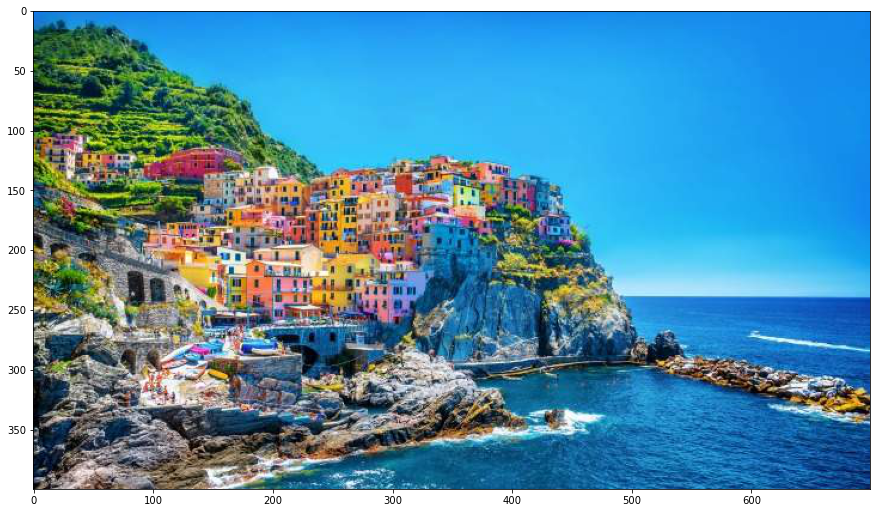

In [4]:
fig = plt.figure(figsize=(15,15))
plt.imshow(image)
plt.show()

## Gray scale conversion

In [5]:
image[0][0]

array([ 21, 120, 247], dtype=uint8)

### Simple averaging

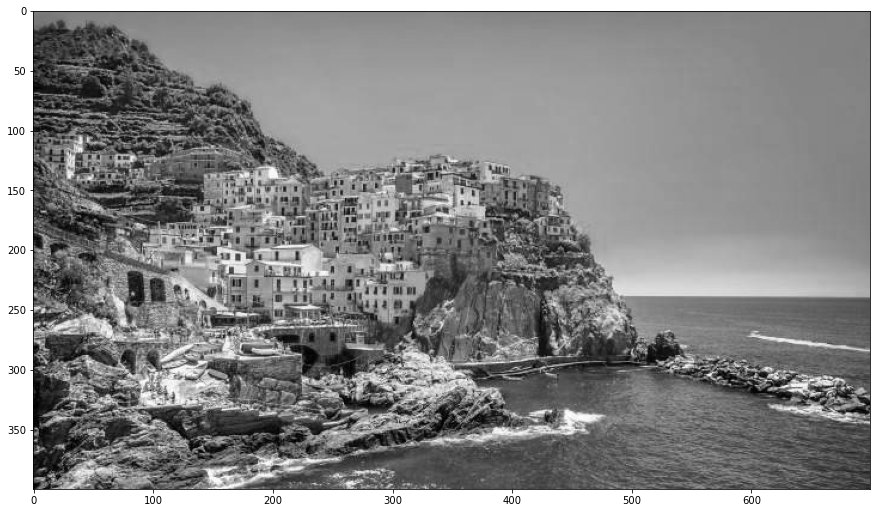

In [6]:
def simple_averaging(pixel):
    return sum(pixel)//3


def convert_image_to_grayscale(image, conversion_function_for_pixel): 
    image_modified = np.zeros(shape = image.shape)
    for i in range(len(image)):
        for j in range(len(image[0])):
                image_modified[i][j] = conversion_function_for_pixel(image[i][j])
    return image_modified

def visualize_results(conversion_function_for_pixel):
    fig = plt.figure(figsize=(15,15))
    image = img.imread('./sample_data/cinqueterre.jpg')
    image_grayscale_converted = convert_image_to_grayscale(image, conversion_function_for_pixel)
    plt.imshow(np.uint8(image_grayscale_converted))
    plt.show()

visualize_results(simple_averaging)

### Weighted average

#### First weighted formula

In [7]:
def weighted_average_first(pixel):
    red = pixel[0]
    green = pixel[1]
    blue = pixel[2]
    return 0.3 * red + 0.59 * green + 0.11 * blue

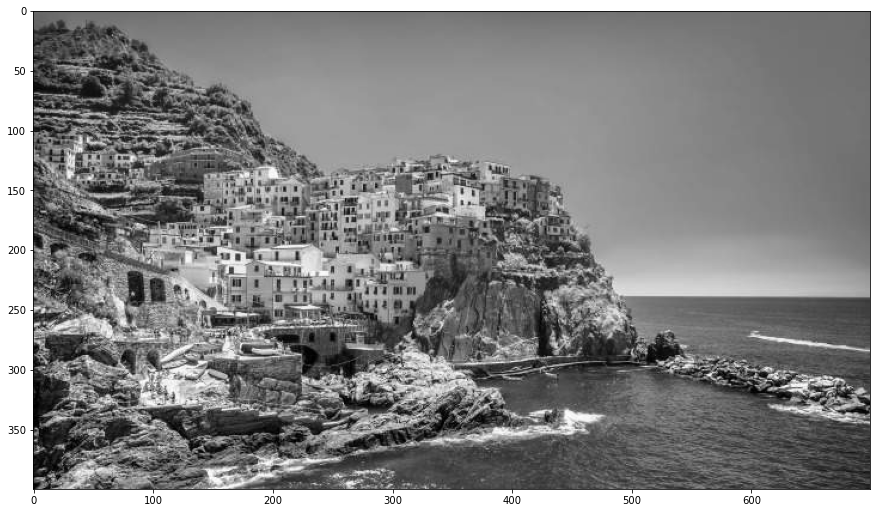

In [8]:
visualize_results(weighted_average_first)

#### Second weighted formula

In [9]:
def weighted_average_second(pixel):
    red = pixel[0]
    green = pixel[1]
    blue = pixel[2]
    return 0.2126 * red + 0.7152 * green + 0.0722 * blue

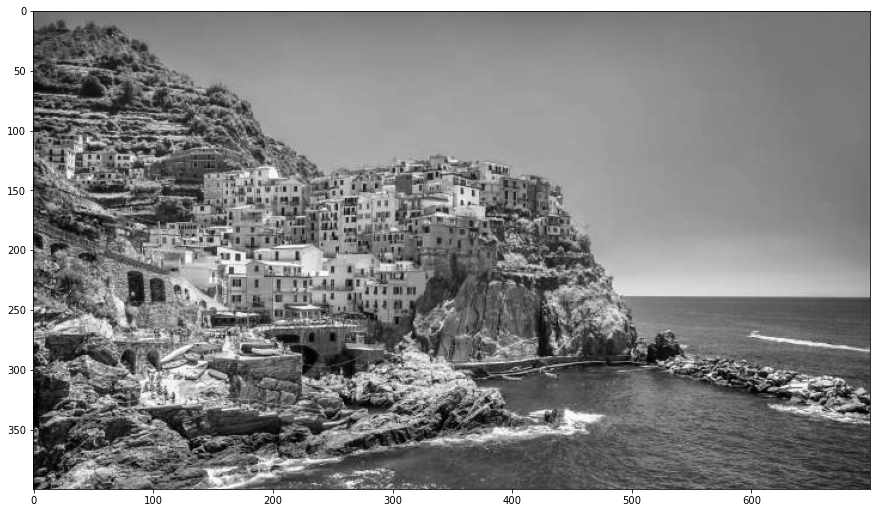

In [10]:
visualize_results(weighted_average_second)

#### Third weighted formula

In [11]:
def weighted_average_third(pixel):
    red = pixel[0]
    green = pixel[1]
    blue = pixel[2]
    return 0.299 * red + 0.587 * green + 0.114 * blue

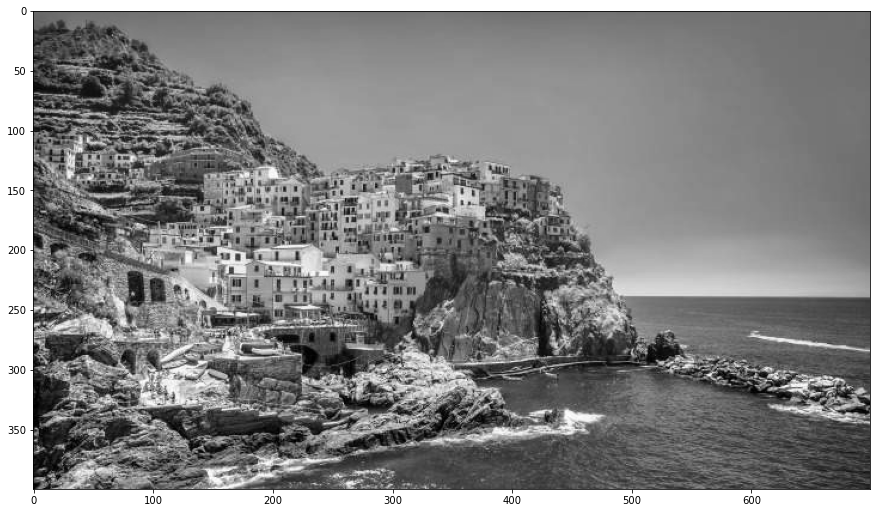

In [12]:
visualize_results(weighted_average_third)

### Desaturation

In [13]:
def desaturation(pixel):
    return (min(pixel) + max(pixel))//2

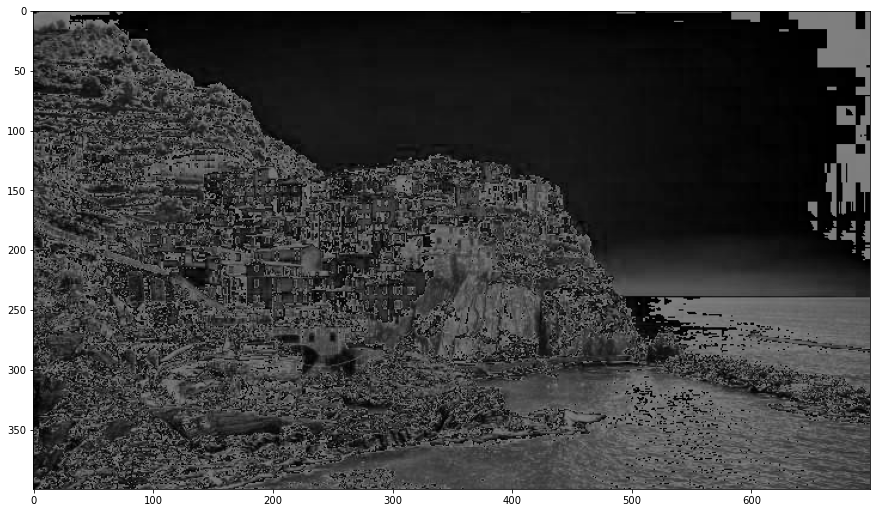

In [14]:
visualize_results(desaturation)

### Decomposition

#### Maximum RGB

In [15]:
def decomposition_max_rgb(pixel):
    return max(pixel)

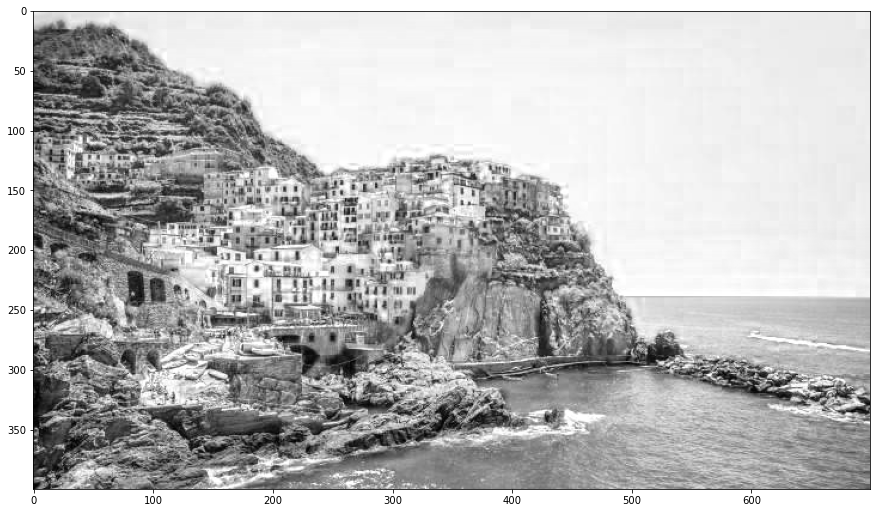

In [16]:
visualize_results(decomposition_max_rgb)

#### Minimum RGB

In [17]:
def decomposition_min_rgb(pixel):
    return min(pixel)

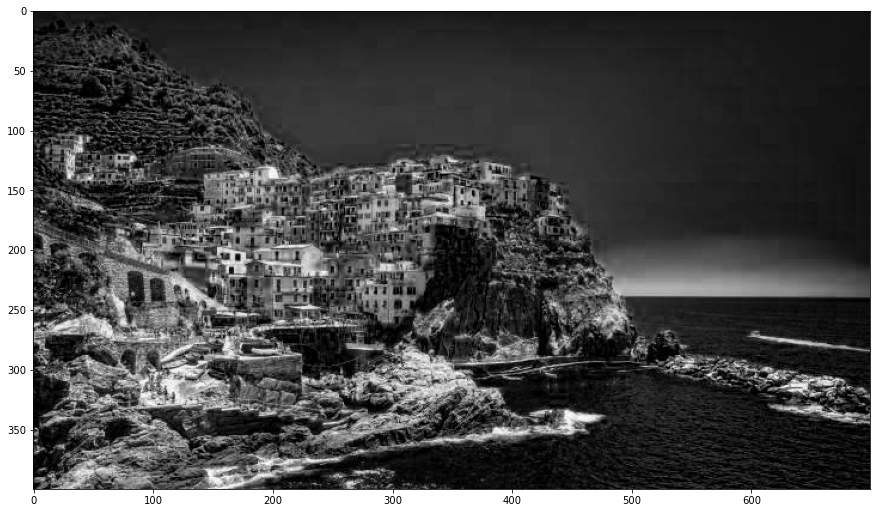

In [18]:
visualize_results(decomposition_min_rgb)

### Single colour channel

#### Gray = R

In [19]:
def single_colour_channel_red(pixel):
    return pixel[0]

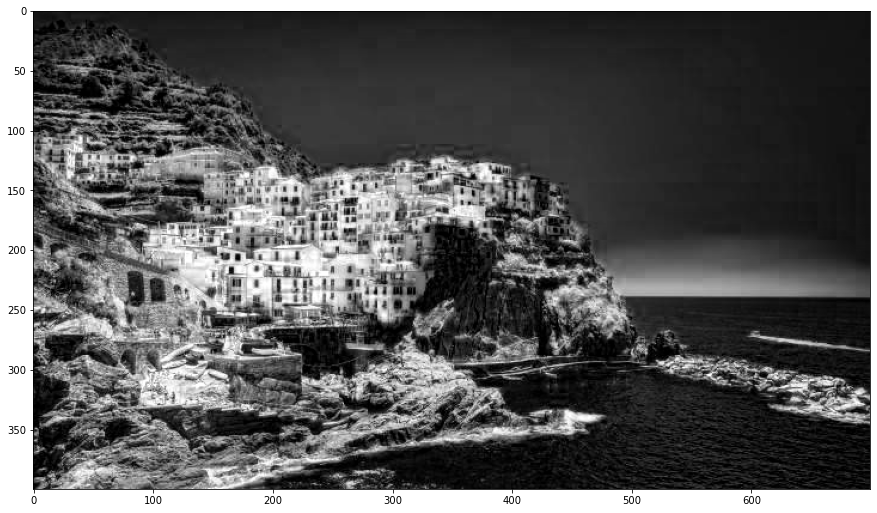

In [20]:
visualize_results(single_colour_channel_red)

#### Gray = G

In [21]:
def single_colour_channel_green(pixel):
    return pixel[1]

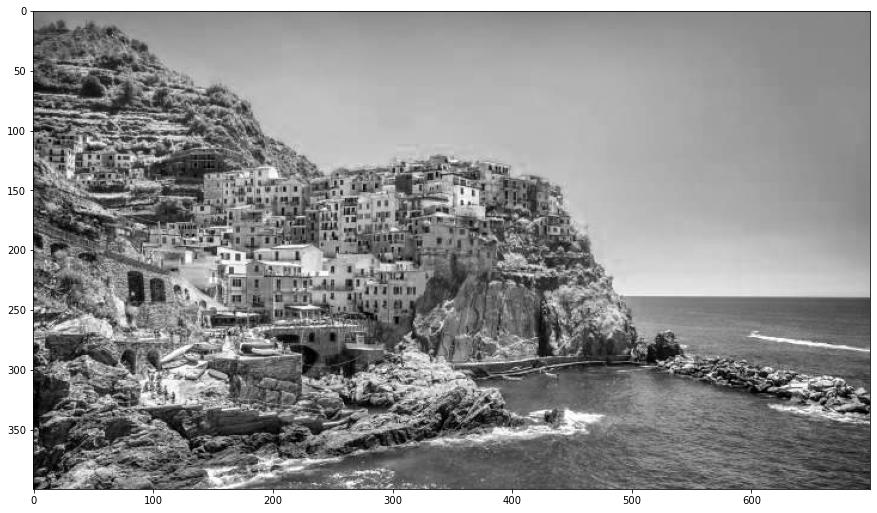

In [22]:
visualize_results(single_colour_channel_green)

#### Gray = B

In [23]:
def single_colour_channel_blue(pixel):
    return pixel[2]

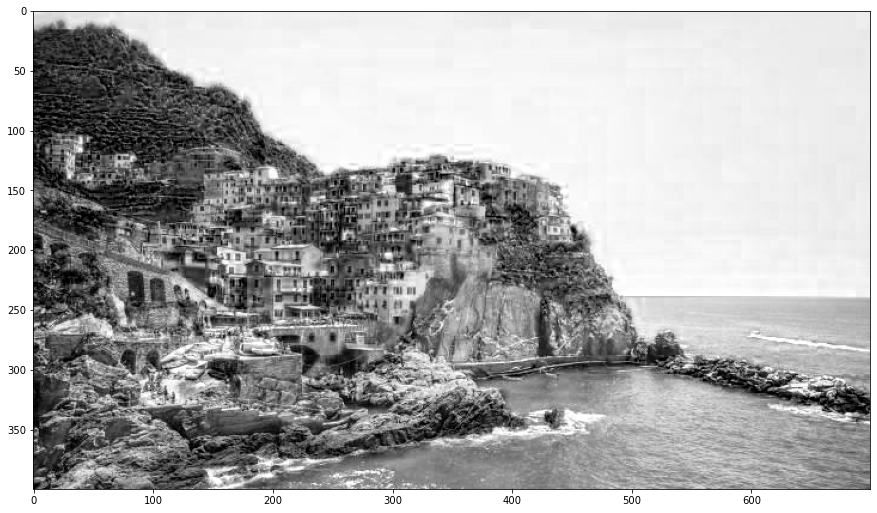

In [24]:
visualize_results(single_colour_channel_blue)

### Custom number of grayscale shades

Steps to be applied: 
-  establish p
-  devide [0, 255] in p disjunct intervals (2)
-  apply wighted average on a given image
-  on the resulted image, decrease the number of shades by using the intervals from (2)

In [25]:
image = img.imread('./sample_data/cinqueterre.jpg')
image_weighted_avg_converted = convert_image_to_grayscale(image, weighted_average_first)

In [26]:
p = 10 # the number of shades is going to be 255
interval_length = 255 / p
intervals_limits = [i * interval_length for i in range(p + 1)]
intervals_limits

[0.0, 25.5, 51.0, 76.5, 102.0, 127.5, 153.0, 178.5, 204.0, 229.5, 255.0]

In [27]:
def get_interval_for_rgb_value(p, value, intervals_limits, verbose=False):
    if value == 255:
        return intervals_limits[-2], intervals_limits[-1]
    for i in range(p, 0, -1):
        if value < intervals_limits[i]:
            continue
        else:
            if verbose:
                print('[' + str(intervals_limits[i]) + ', ' + str(intervals_limits[i + 1]) + ')') 
            return intervals_limits[i], intervals_limits[i+1]
    return intervals_limits[i-1], intervals_limits[i]
        
get_interval_for_rgb_value(10, 20.8, intervals_limits, verbose=True)

(0.0, 25.5)

In [28]:
get_interval_for_rgb_value(10, 255, intervals_limits, verbose=True)

(229.5, 255.0)

In [29]:
def get_averaged_value_for_rgb_from_interval(lower_interval_lim, upper_interval_lim):
    return (lower_interval_lim + upper_interval_lim - 1) / 2

get_averaged_value_for_rgb_from_interval(127.5, 153)

139.75

The interval lenght is: 25.5
The interval limits are: [0.0, 25.5, 51.0, 76.5, 102.0, 127.5, 153.0, 178.5, 204.0, 229.5, 255.0]
The unique shades are: [12.25, 37.75, 63.25, 88.75, 114.25, 139.75, 165.25, 190.75, 216.25, 241.75]


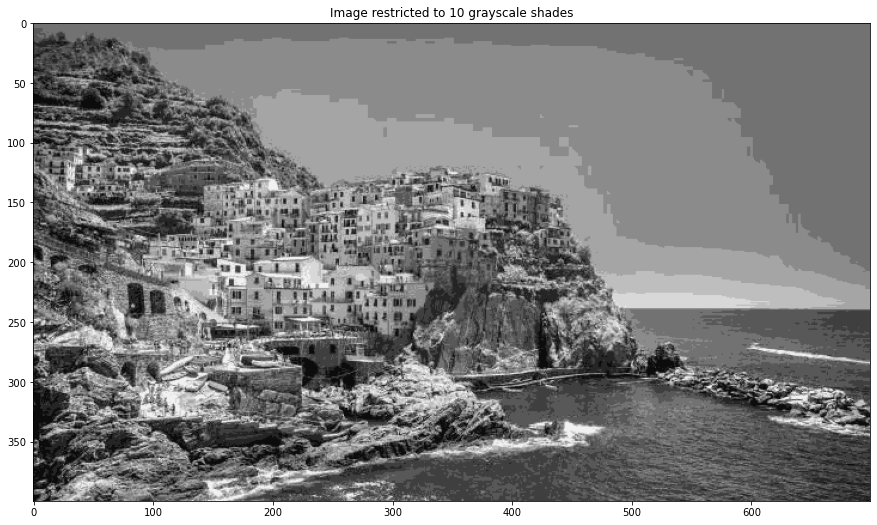

In [30]:
def decrease_grayscale_shades(p, image_weighted_avg_converted, intervals_limits):
    unique_shades = set()
    image_modified = np.zeros(shape = image.shape)
    for i in range(len(image_weighted_avg_converted)):
        for j in range(len(image_weighted_avg_converted[0])):
            lower_interval_lim, upper_interval_lim = get_interval_for_rgb_value(p, image_weighted_avg_converted[i][j][0], intervals_limits)
            current_shade = get_averaged_value_for_rgb_from_interval(lower_interval_lim, upper_interval_lim)
            image_modified[i][j] = current_shade
            unique_shades.add(current_shade)
    print("The unique shades are: " + str(sorted(unique_shades)))
    return image_modified


def convert_image_to_custom_no_of_grayscale_shades(p):
    image = img.imread('./sample_data/cinqueterre.jpg')
    image_weighted_avg_converted = convert_image_to_grayscale(image, weighted_average_first)
    
    interval_length = 255 / p
    print("The interval lenght is: " + str(interval_length))
    
    intervals_limits = [i * interval_length for i in range(p + 1)]
    print("The interval limits are: " + str(intervals_limits))
    
    modified_image = decrease_grayscale_shades(p, image_weighted_avg_converted, intervals_limits)
    
    fig = plt.figure(figsize=(15,15))
    plt.imshow(np.uint8(modified_image))
    plt.title("Image restricted to " + str(p) + " grayscale shades")
    plt.show()
    
convert_image_to_custom_no_of_grayscale_shades(10)

The interval lenght is: 85.0
The interval limits are: [0.0, 85.0, 170.0, 255.0]
The unique shades are: [42.0, 127.0, 212.0]


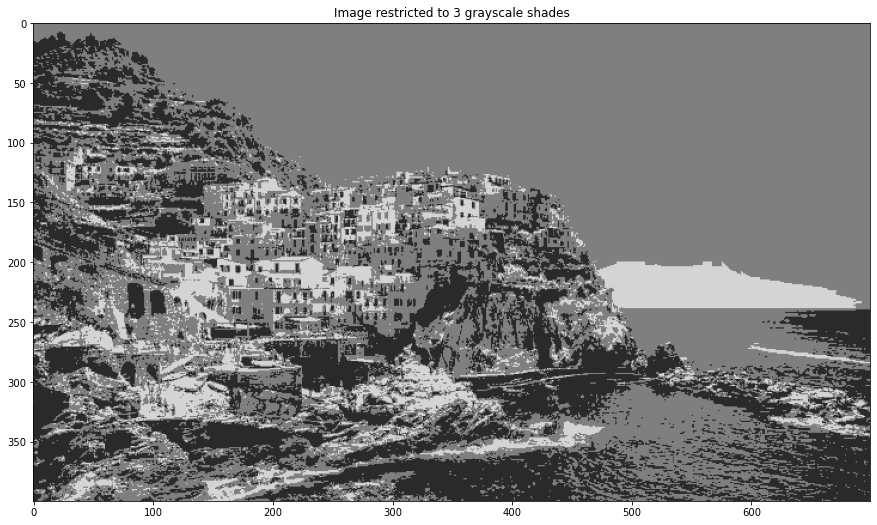

In [31]:
convert_image_to_custom_no_of_grayscale_shades(3)

The interval lenght is: 255.0
The interval limits are: [0.0, 255.0]
The unique shades are: [127.0]


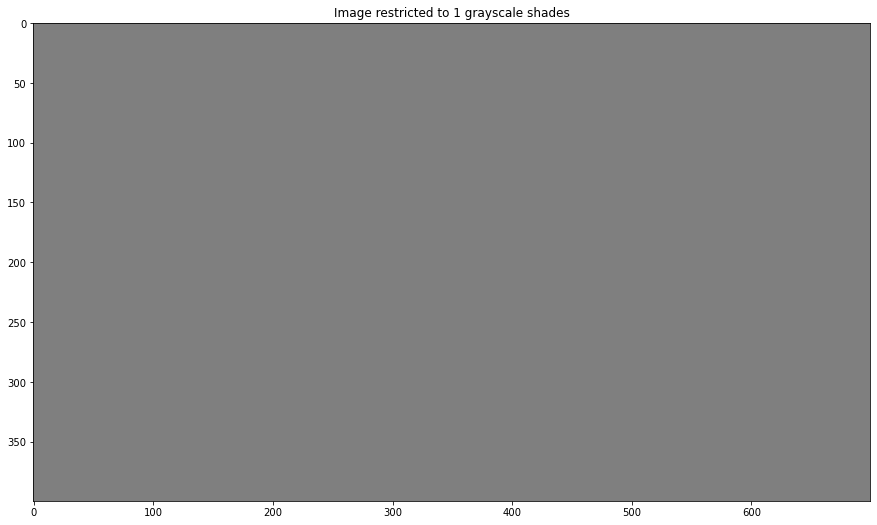

In [32]:
convert_image_to_custom_no_of_grayscale_shades(1)

The interval lenght is: 1.0
The interval limits are: [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0,

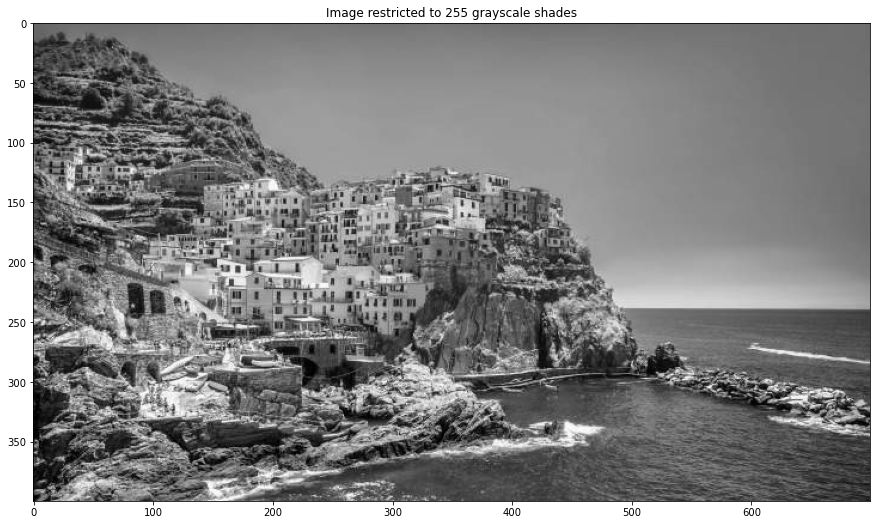

In [33]:
convert_image_to_custom_no_of_grayscale_shades(255)

### Custom number of grey shades with error-diffusion dithering

In [34]:
def nearest_color(rgb_value):
    if rgb_value <= 255 / 2:
        return 0
    else: 
        return 255

nearest_color(170)

255

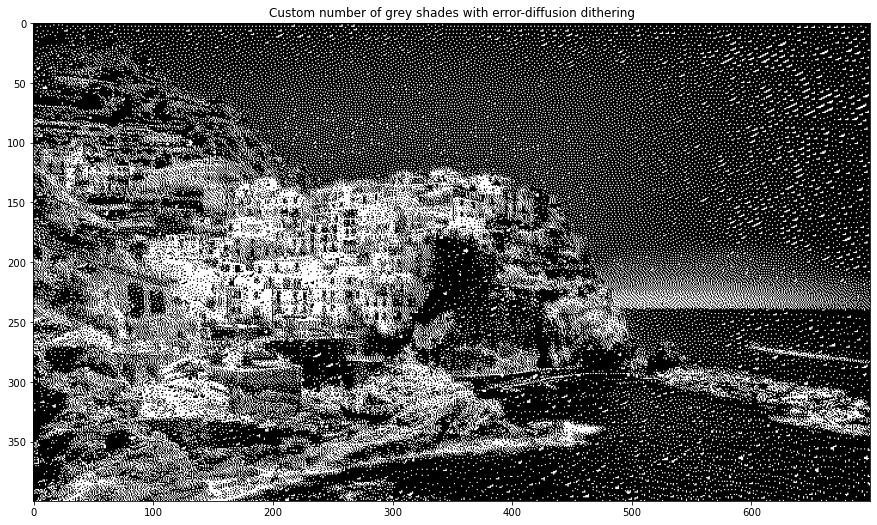

In [35]:
def error_diffusion_dithering_grayscale():
    image_immutable = np.asarray(img.imread('./sample_data/cinqueterre.jpg'))
    image = image_immutable.copy()
    image_modified = np.zeros(shape = image.shape)
    
    for i in range(len(image)):
        for j in range(len(image[0])):
            
            image_modified[i][j] = nearest_color(image[i][j][0])
            err = image[i][j][0] - image_modified[i][j]
            
            if j != len(image[0]) - 1:
                np.add(image[i][j + 1], err * (7/16), 
                       out=image[i][j + 1], casting="unsafe")
            if i != len(image) - 1:
                if j > 0:
                    np.add(image[i + 1][j - 1], err * (3/16), 
                           out=image[i + 1][j - 1], casting="unsafe")

                np.add(image[i + 1][j], err * (5/16), 
                       out=image[i + 1][j], casting="unsafe")

                if j != len(image[0]) - 1:
                    np.add(image[i + 1][j + 1], err * (1/16), 
                           out=image[i + 1][j + 1], casting="unsafe")
    return image_modified

image_error_diffusion_dithering = error_diffusion_dithering_grayscale()
fig = plt.figure(figsize=(15,15))
plt.imshow(np.uint8(image_error_diffusion_dithering))
plt.title("Custom number of grey shades with error-diffusion dithering")
plt.show()

### From grayscale to color

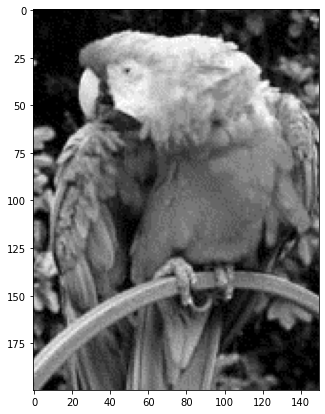

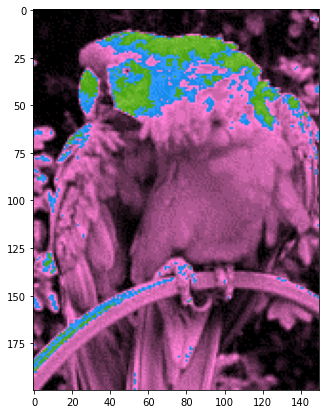

In [36]:
before = cv2.imread('./sample_data/grayscale.png')
b, g, r = cv2.split(before)

np.multiply(b, 1.5, out=b, casting="unsafe")
np.multiply(g, .75, out=g, casting="unsafe")
np.multiply(r, 1.25, out=r, casting="unsafe")

after = cv2.merge([b, g, r])

fig = plt.figure(figsize=(9,7))
plt.imshow(np.uint8(before))
plt.show()

fig = plt.figure(figsize=(9,7))
plt.imshow(np.uint8(after))
plt.show()

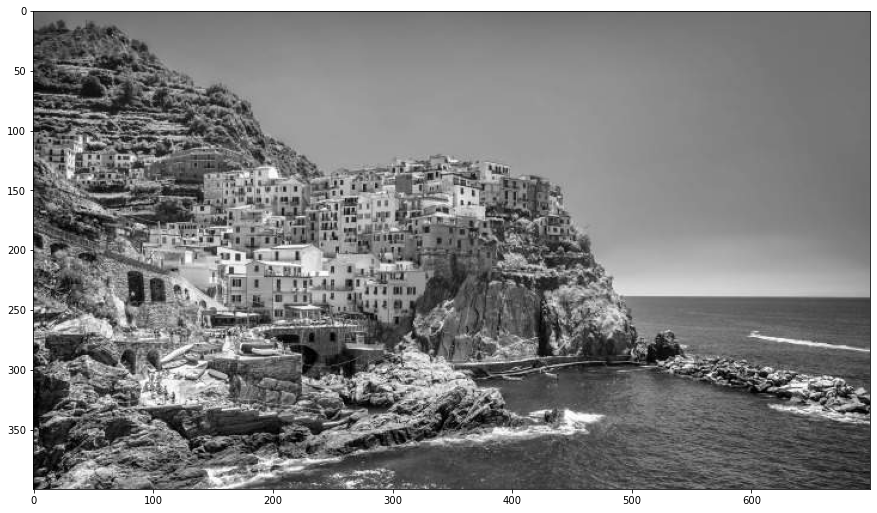

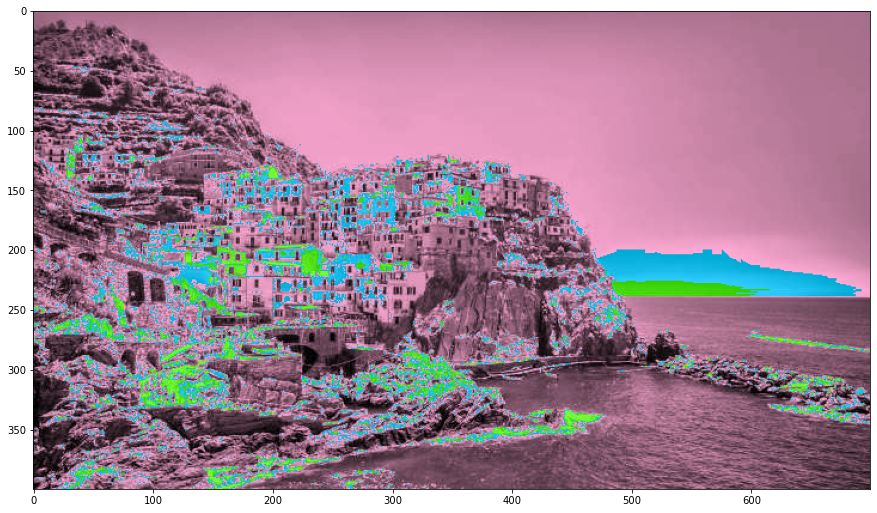

In [37]:
gray = cv2.imread('./sample_data/cinqueterre.jpg', 0)
before = cv2.merge([gray, gray, gray])
b, g, r = cv2.split(before)

np.multiply(b, 1.5, out=b, casting="unsafe")
np.multiply(g, 1, out=g, casting="unsafe")
np.multiply(r, 1.25, out=r, casting="unsafe")

after = cv2.merge([b, g, r])

fig = plt.figure(figsize=(15,15))
plt.imshow(np.uint8(before))
plt.show()

fig = plt.figure(figsize=(15,15))
plt.imshow(np.uint8(after))
plt.show()